In [2]:
import numpy as np
import pandas as pd
from array import *
from PIL import Image, ImageOps
from matplotlib.pyplot import imshow
from matplotlib import pyplot as plt
from numpy import linalg as lg
from skimage.util import *
from skimage.metrics import *
from skimage.filters import laplace, sobel, roberts
from skimage import color, data, measure
from skimage.io import imread
from skimage.transform import resize
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.feature_extraction import image
import tensorflow as tf
from tensorboard.plugins import projector
from keras.models import Sequential, Model
from keras.layers import Input, Dense, Flatten, Conv2D, MaxPool2D, Layer, Activation, UpSampling2D,  \
    BatchNormalization, MaxPooling2D, Conv2DTranspose, Reshape, BatchNormalization, ReLU, Concatenate
from keras.callbacks import ModelCheckpoint
from keras.models import load_model
from tensorflow.keras import activations, callbacks
import random
import cv2
import math
import os
import time
from os.path import isfile, join, exists
import re
import joblib
import glob
from collections import Counter

from utils import *

In [3]:
constants_dictionary = json.load(open("constants.json","r"))
VALID_NOISE_STRENGHTS = constants_dictionary.get('VALID_NOISE_STRENGHTS')
VALID_NOISE_TYPES = constants_dictionary.get('VALID_NOISE_TYPES') 
noise_dictionary = constants_dictionary.get('noise_dictionary')
noise_levels_dictionary = constants_dictionary.get('noise_levels_dictionary')
categorical_classes_dictionary = constants_dictionary.get('categorical_classes_dictionary')
base_name = constants_dictionary.get('base_name_dae_images')
mypath = constants_dictionary.get('path_images')

## cpu / gpu

In [ ]:
devices = tf.config.experimental.list_physical_devices('GPU')
print("Available: ", tf.config.list_physical_devices())

# tf.config.experimental.set_memory_growth(devices[0], enable=True)

# Denoising Autoencoder Grayscale

## Gaussian 256

In [ ]:
with tf.device('/GPU:0'):
    images_size_256= 256
    x_256, y_256, y_noise_info_256 = get_ds_from_pkl(mypath, resize_images_to=images_size_256, noise_types='gaussian')

    X_train_256, X_test_256, y_train_256, y_test_256 = train_test_split(
        x_256, 
        y_256, 
        test_size=0.15, 
        shuffle=True,
        random_state=42,
    )
    d4_train_256_gaussian = X_train_256.reshape((X_train_256.shape[0], X_train_256.shape[1], X_train_256.shape[2], 1))
    d4_test_256_gaussian=X_test_256.reshape((X_test_256.shape[0], X_test_256.shape[1], X_test_256.shape[2], 1))


## Impulse 256

In [ ]:
with tf.device('/GPU:0'):
    x_256, y_256, y_noise_info_256 = get_ds_from_pkl(mypath, resize_images_to=images_size_256, noise_types='s&p')

    X_train_256, X_test_256, y_train_256_impulse, y_test_256_impulse = train_test_split(
        x_256, 
        y_256, 
        test_size=0.15, 
        shuffle=True,
        random_state=42,
    )
    d4_train_256_impulse = X_train_256.reshape((X_train_256.shape[0], X_train_256.shape[1], X_train_256.shape[2], 1))
    d4_test_256_impulse=X_test_256.reshape((X_test_256.shape[0], X_test_256.shape[1], X_test_256.shape[2], 1))


## Speckle 256

In [ ]:
with tf.device('/GPU:0'):
    x_256, y_256, y_noise_info_256 = get_ds_from_pkl(mypath, resize_images_to=images_size_256, noise_types='speckle')

    X_train_256, X_test_256, y_train_256_speckle, y_test_256_speckle = train_test_split(
        x_256, 
        y_256, 
        test_size=0.15, 
        shuffle=True,
        random_state=42,
    )
    d4_train_256_speckle = X_train_256.reshape((X_train_256.shape[0], X_train_256.shape[1], X_train_256.shape[2], 1))
    d4_test_256_speckle=X_test_256.reshape((X_test_256.shape[0], X_test_256.shape[1], X_test_256.shape[2], 1))


# build model

## gaussian

In [17]:
# # from https://github.com/developershutt/Autoencoders/blob/main/3%20-%20Denoise%20Autoencoder/Code.ipynb

# Encoder
encoder_input = Input(shape=(256,256,1))
x1 = Conv2D(128, (3,3), activation='relu', padding='same')(encoder_input)
x1 = BatchNormalization()(x1)
x1 = MaxPool2D(pool_size = (2,2), padding='same')(x1)
x2 = Conv2D(64, (3,3), activation='relu', padding='same')(x1)
x2 = BatchNormalization()(x2)
x2 = MaxPool2D(pool_size = (2,2), padding='same')(x2)
x3 = Conv2D(32, (3,3), activation='relu', padding='same')(x2)
x3 = BatchNormalization()(x3)
encoded = MaxPool2D(pool_size = (2,2), padding='same')(x3)


# Decoder
x3 = Conv2D(32, (3,3), activation='relu', padding='same')(encoded)
x3 = BatchNormalization()(x3)
x3 = UpSampling2D((2,2))(x3)
x2 = Conv2D(64, (3,3), activation='relu', padding='same')(x2)
x2 = BatchNormalization()(x2)
x2 = UpSampling2D((2,2))(x2)
x1 = Conv2D(128, (3,3), activation='relu', padding='same')(x2)
x1 = BatchNormalization()(x1)
x1 = UpSampling2D((2,2))(x1)
decoded = Conv2D(1, (3,3), activation='sigmoid', padding= 'same')(x1)

dae_gaussian = Model(encoder_input, decoded, name = 'Denoising_Autoencoder_gaussian')
dae_gaussian.compile(optimizer="adam", loss="mse")
dae_gaussian.summary()


start_time = time.time()

with tf.device('/GPU:0'):
    checkpoint = ModelCheckpoint('Denoising_Autoencoder_gaussian.h5', save_best_only=True, save_weights_only=False, verbose=1)
    history = dae_gaussian.fit(d4_train_256_gaussian, y_train_256, batch_size=4, epochs=50, callbacks=checkpoint, validation_split=0.25, verbose=2)

end_time = time.time()
elapsed_time = end_time - start_time
print('Execution time:', elapsed_time, 'seconds')


Model: "Denoising_Autoencoder_gaussian"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         [(None, 256, 256, 1)]     0         
_________________________________________________________________
conv2d_7 (Conv2D)            (None, 256, 256, 128)     1280      
_________________________________________________________________
batch_normalization_6 (Batch (None, 256, 256, 128)     512       
_________________________________________________________________
max_pooling2d_3 (MaxPooling2 (None, 128, 128, 128)     0         
_________________________________________________________________
conv2d_8 (Conv2D)            (None, 128, 128, 64)      73792     
_________________________________________________________________
batch_normalization_7 (Batch (None, 128, 128, 64)      256       
_________________________________________________________________
max_pooling2d_4 (MaxPooling2 (None, 

# Impulse

In [31]:
# Encoder
encoder_input = Input(shape=(256,256,1))
x1 = Conv2D(128, (3,3), activation='relu', padding='same')(encoder_input)
x1 = BatchNormalization()(x1)
x1 = MaxPool2D(pool_size = (2,2), padding='same')(x1)
x2 = Conv2D(64, (3,3), activation='relu', padding='same')(x1)
x2 = BatchNormalization()(x2)
x2 = MaxPool2D(pool_size = (2,2), padding='same')(x2)
x3 = Conv2D(32, (3,3), activation='relu', padding='same')(x2)
x3 = BatchNormalization()(x3)
encoded = MaxPool2D(pool_size = (2,2), padding='same')(x3)


# Decoder
x3 = Conv2D(32, (3,3), activation='relu', padding='same')(encoded)
x3 = BatchNormalization()(x3)
x3 = UpSampling2D((2,2))(x3)
x2 = Conv2D(64, (3,3), activation='relu', padding='same')(x2)
x2 = BatchNormalization()(x2)
x2 = UpSampling2D((2,2))(x2)
x1 = Conv2D(128, (3,3), activation='relu', padding='same')(x2)
x1 = BatchNormalization()(x1)
x1 = UpSampling2D((2,2))(x1)
decoded = Conv2D(1, (3,3), activation='sigmoid', padding= 'same')(x1)


dae_impulse = Model(encoder_input, decoded, name = 'Denoising_Autoencoder_impulse')
dae_impulse.compile(optimizer="adam", loss="mse")
dae_impulse.summary()

start_time = time.time()
with tf.device('/GPU:0'):
    checkpoint = ModelCheckpoint('Denoising_Autoencoder_impulse.h5', save_best_only=True, save_weights_only=False, verbose=1)
    history = dae_impulse.fit(d4_train_256_impulse, y_train_256_impulse, batch_size=4, epochs=40, callbacks=checkpoint, validation_split=0.25, verbose=2)

end_time = time.time()
elapsed_time = end_time - start_time
print('Execution time:', elapsed_time, 'seconds')


Model: "Denoising_Autoencoder_impulse"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_5 (InputLayer)         [(None, 256, 256, 1)]     0         
_________________________________________________________________
conv2d_28 (Conv2D)           (None, 256, 256, 128)     1280      
_________________________________________________________________
batch_normalization_24 (Batc (None, 256, 256, 128)     512       
_________________________________________________________________
max_pooling2d_12 (MaxPooling (None, 128, 128, 128)     0         
_________________________________________________________________
conv2d_29 (Conv2D)           (None, 128, 128, 64)      73792     
_________________________________________________________________
batch_normalization_25 (Batc (None, 128, 128, 64)      256       
_________________________________________________________________
max_pooling2d_13 (MaxPooling (None, 6

# Speckle

In [26]:
# Encoder
encoder_input = Input(shape=(256,256,1))
x1 = Conv2D(128, (3,3), activation='relu', padding='same')(encoder_input)
x1 = BatchNormalization()(x1)
x1 = MaxPool2D(pool_size = (2,2), padding='same')(x1)
x2 = Conv2D(64, (3,3), activation='relu', padding='same')(x1)
x2 = BatchNormalization()(x2)
x2 = MaxPool2D(pool_size = (2,2), padding='same')(x2)
x3 = Conv2D(32, (3,3), activation='relu', padding='same')(x2)
x3 = BatchNormalization()(x3)
encoded = MaxPool2D(pool_size = (2,2), padding='same')(x3)


# Decoder
x3 = Conv2D(32, (3,3), activation='relu', padding='same')(encoded)
x3 = BatchNormalization()(x3)
x3 = UpSampling2D((2,2))(x3)
x2 = Conv2D(64, (3,3), activation='relu', padding='same')(x2)
x2 = BatchNormalization()(x2)
x2 = UpSampling2D((2,2))(x2)
x1 = Conv2D(128, (3,3), activation='relu', padding='same')(x2)
x1 = BatchNormalization()(x1)
x1 = UpSampling2D((2,2))(x1)
decoded = Conv2D(1, (3,3), activation='sigmoid', padding= 'same')(x1)



dae_speckle = Model(encoder_input, decoded, name = 'Denoising_Autoencoder_speckle')
dae_speckle.compile(optimizer="adam", loss="mse")
dae_speckle.summary()

start_time = time.time()
with tf.device('/GPU:0'):
    checkpoint = ModelCheckpoint('Denoising_Autoencoder_speckle.h5', save_best_only=True, save_weights_only=False, verbose=1)
    history = dae_speckle.fit(d4_train_256_speckle, y_train_256_speckle, batch_size=4, epochs=40, callbacks=checkpoint, validation_split=0.25, verbose=2)

end_time = time.time()
elapsed_time = end_time - start_time
print('Execution time:', elapsed_time, 'seconds')


Model: "Denoising_Autoencoder_speckle"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_4 (InputLayer)         [(None, 256, 256, 1)]     0         
_________________________________________________________________
conv2d_21 (Conv2D)           (None, 256, 256, 128)     1280      
_________________________________________________________________
batch_normalization_18 (Batc (None, 256, 256, 128)     512       
_________________________________________________________________
max_pooling2d_9 (MaxPooling2 (None, 128, 128, 128)     0         
_________________________________________________________________
conv2d_22 (Conv2D)           (None, 128, 128, 64)      73792     
_________________________________________________________________
batch_normalization_19 (Batc (None, 128, 128, 64)      256       
_________________________________________________________________
max_pooling2d_10 (MaxPooling (None, 6

In [22]:
dae_impulse = load_model('Denoising_Autoencoder_impulse.h5')
dae_speckle = load_model('Denoising_Autoencoder_speckle.h5')

# Evaluation

### Gaussian Denoising Autoencoder Measurments

noisy images blur average:  0.4180045745183162
ground truth images blur:  0.027645069136721906
reconstructd images blur:  0.005939780557457875
PSNR noisy - ground truth:  58.18650598873588
PSNR reconstructed - ground truth:  59.176565330979074
noisy images blur average:  0.4226796314327927
ground truth images blur:  0.027874581993657412
reconstructd images blur:  0.005755768826889431
PSNR noisy - ground truth:  58.21771389493703
PSNR reconstructed - ground truth:  59.255447161879054
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
(256, 256, 1)
(256, 256, 1)
gaussian with low variance
noisy image blur:  0.0610006987782167
ground truth image blur:  0.02623146558715398
reconstructed image blur:  0.003491234
PSNR noisy - ground truth:  75.66370936503667
PSNR reconstructed - ground truth:  75.58217291577785
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
(256, 256, 1)
(256, 256, 1)
gaussian with medium variance
noisy image blur:  0.13507513867792725
ground truth image blur:  0.0262314655871

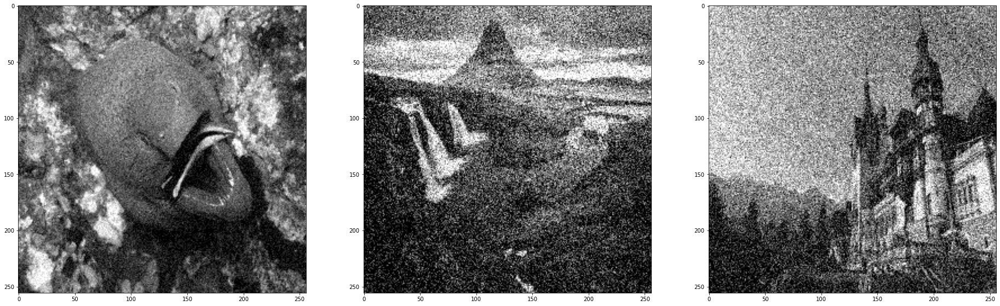

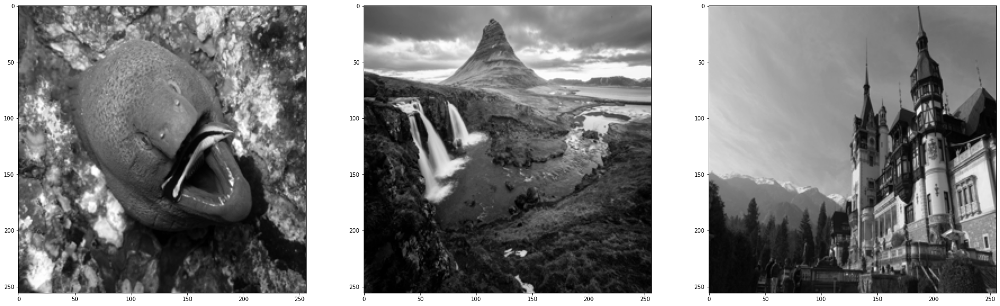

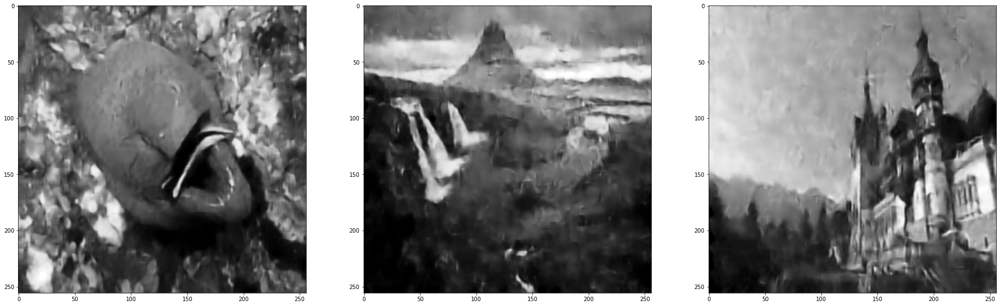

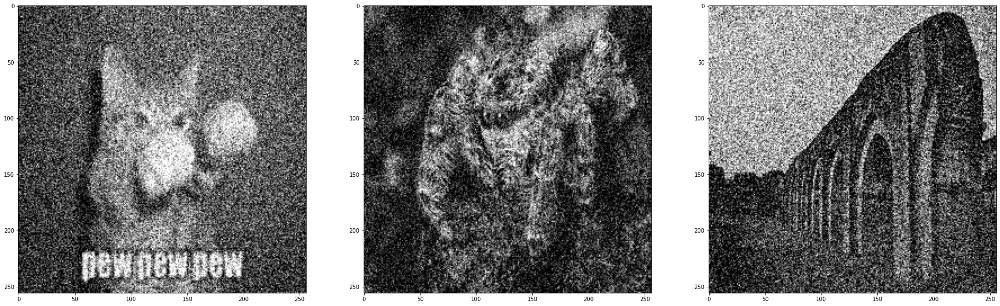

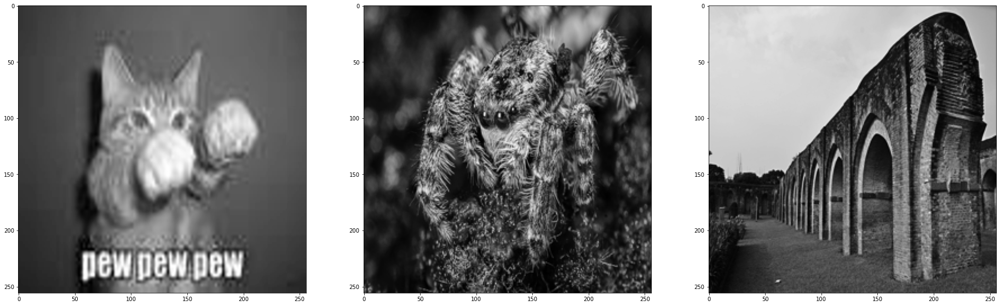

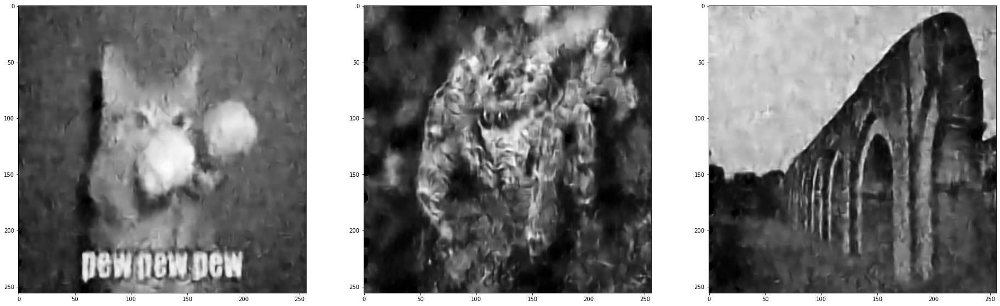

In [20]:
dae_gaussian = load_model('Denoising_Autoencoder_gaussian.h5')

# whole dataset
evaluate_psnr_blur(d4_train_256_gaussian,y_train_256,dae_gaussian)
evaluate_psnr_blur(d4_test_256_gaussian,y_test_256,dae_gaussian)

# single image
for var in noise_dictionary.keys() + noise_levels_dictionary.keys():
    evaluate_image('gaussian', var, dae_gaussian)
    
start_time = time.time()
x_test, y_test, y_ground_truth = get_single_noisy_image('gaussian', 'level5')

prediction = dae_gaussian.predict(np.expand_dims((x_test), axis=0))
end_time = time.time()
elapsed_time = end_time - start_time
print('Execution time:', elapsed_time, 'seconds')
    

###  Impulse Denoising Autoencoder Measurments

noisy images blur average:  1.0420054432690609
ground truth images blur:  0.027645069136721906
reconstructd images blur:  0.007547547339138463
PSNR noisy - ground truth:  57.29322648600278
PSNR reconstructed - ground truth:  59.15702440367223
noisy images blur average:  1.042057225732324
ground truth images blur:  0.027874581993657412
reconstructd images blur:  0.007465893136557295
PSNR noisy - ground truth:  57.309164497581435
PSNR reconstructed - ground truth:  59.234446279589115
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
(256, 256, 1)
(256, 256, 1)
s&p with level1 variance
noisy image blur:  0.2645452873819565
ground truth image blur:  0.02623146558715398
reconstructed image blur:  0.005415547
PSNR noisy - ground truth:  67.28771967323276
PSNR reconstructed - ground truth:  76.16806759054316
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
(256, 256, 1)
(256, 256, 1)
s&p with level2 variance
noisy image blur:  0.3539969241660359
ground truth image blur:  0.02623146558715398
reco

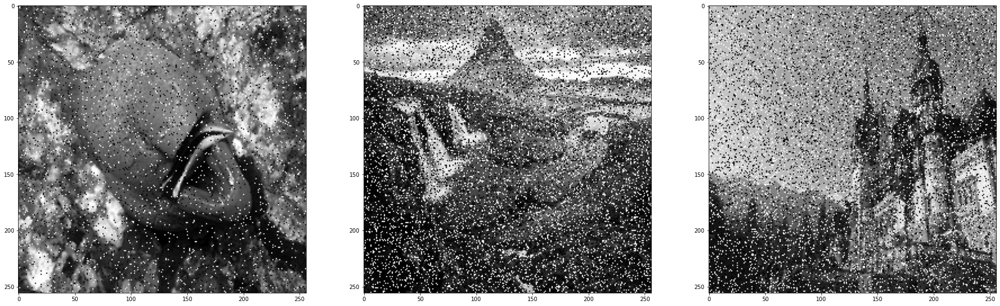

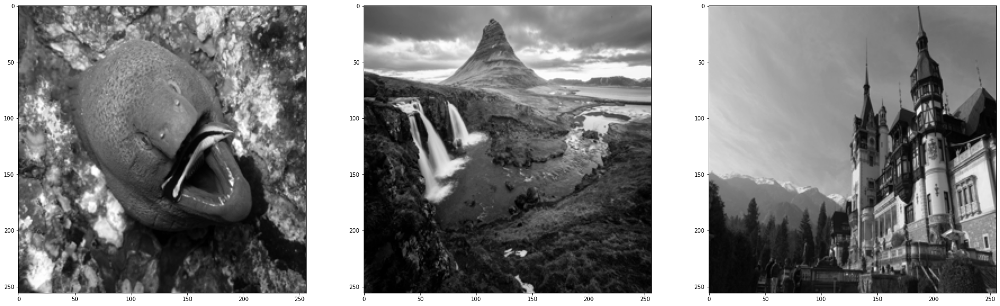

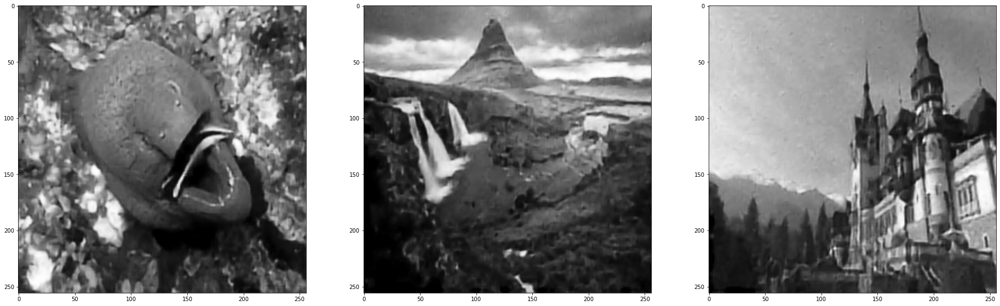

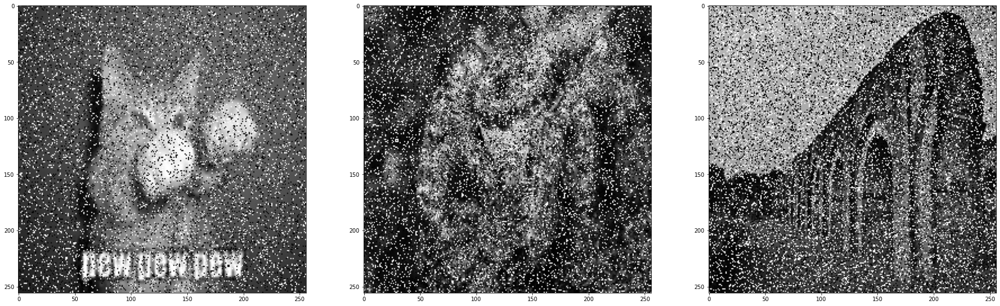

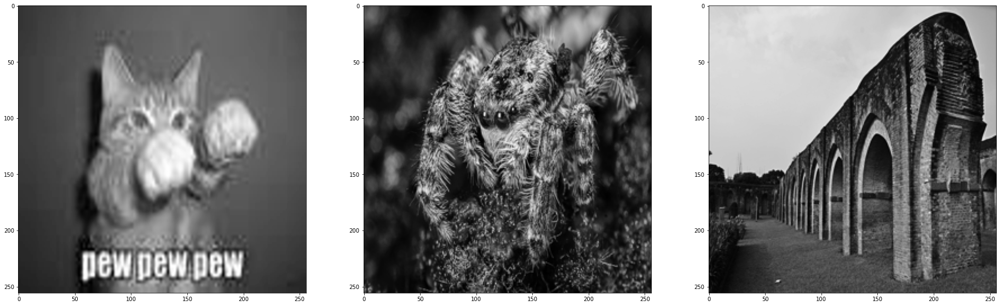

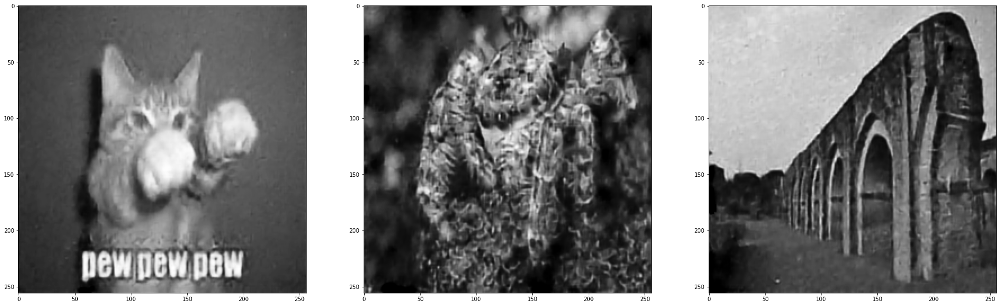

In [32]:
dae_impulse = load_model('Denoising_Autoencoder_impulse.h5')

# whole dataset
evaluate_psnr_blur(d4_train_256_impulse,y_train_256,dae_impulse)
evaluate_psnr_blur(d4_test_256_impulse,y_test_256,dae_impulse)

# single image
for var in noise_dictionary.keys() + noise_levels_dictionary.keys():
    evaluate_image('s&p', var, dae_impulse)    

start_time = time.time()
x_test, y_test, y_ground_truth = get_single_noisy_image('s&p', 'level5')

prediction = dae_gaussian.predict(np.expand_dims((x_test), axis=0))
end_time = time.time()
elapsed_time = end_time - start_time
print('Execution time:', elapsed_time, 'seconds')

###  Speckle Denoising Autoencoder Measurments

noisy images blur average:  0.5482127535374081
ground truth images blur:  0.027645069136721906
reconstructd images blur:  0.006126337956458669
PSNR noisy - ground truth:  57.94348335659099
PSNR reconstructed - ground truth:  59.1598383231838
noisy images blur average:  0.5455244898394918
ground truth images blur:  0.027874581993657412
reconstructd images blur:  0.005926167973949406
PSNR noisy - ground truth:  57.98128861430577
PSNR reconstructed - ground truth:  59.23824164328083
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
(256, 256, 1)
(256, 256, 1)
speckle with level1 variance
noisy image blur:  0.16611612219319635
ground truth image blur:  0.02623146558715398
reconstructed image blur:  0.003515265
PSNR noisy - ground truth:  69.67200844330515
PSNR reconstructed - ground truth:  74.63305629962717
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
(256, 256, 1)
(256, 256, 1)
speckle with level2 variance
noisy image blur:  0.4235522804324088
ground truth image blur:  0.026231465587153

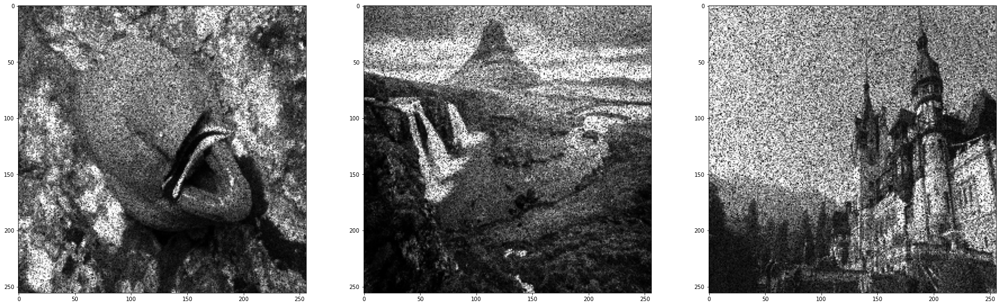

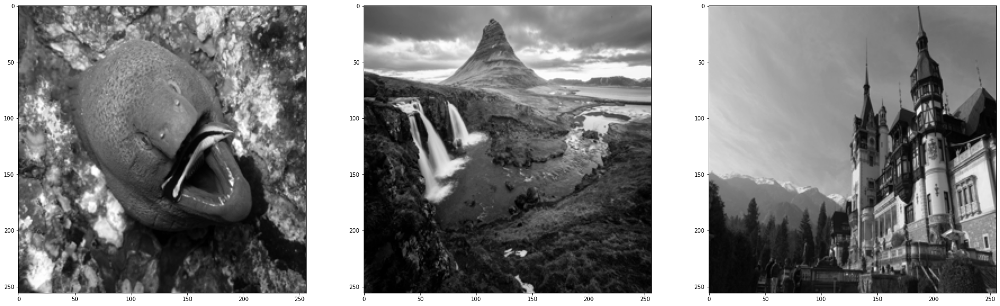

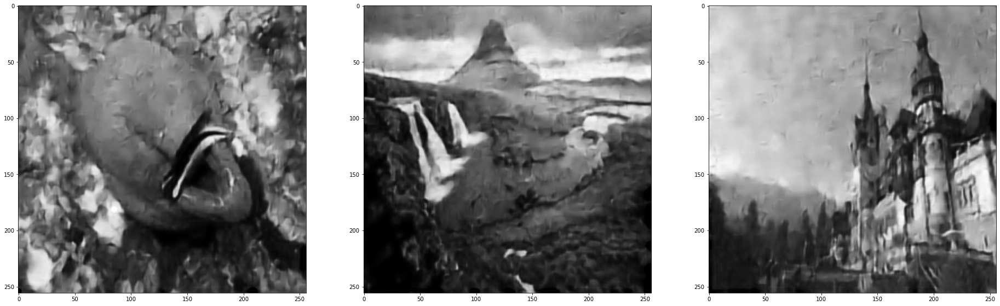

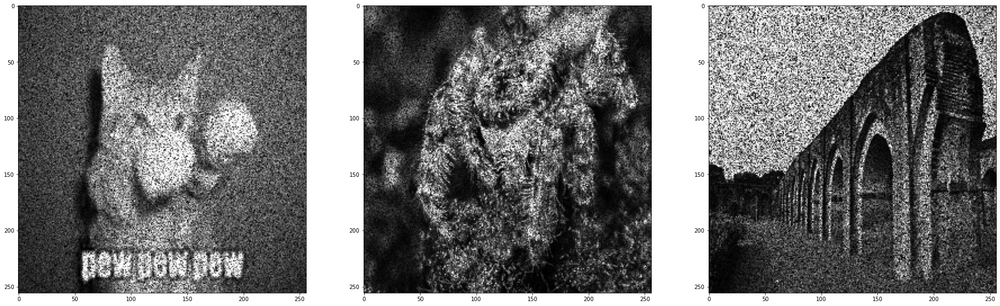

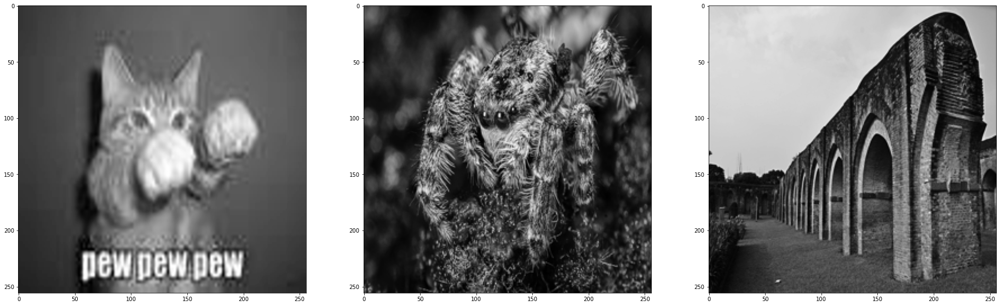

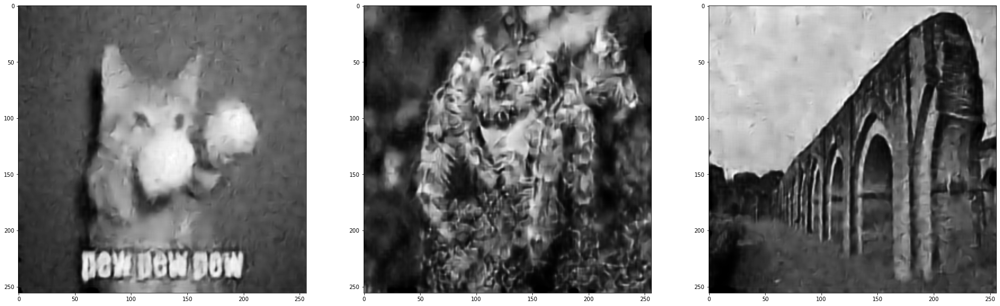

In [33]:
dae_speckle = load_model('Denoising_Autoencoder_speckle.h5')

# whole dataset
evaluate_psnr_blur(d4_train_256_speckle,y_train_256,dae_speckle)
evaluate_psnr_blur(d4_test_256_speckle,y_test_256,dae_speckle)

# single image
for var in noise_dictionary.keys() + noise_levels_dictionary.keys():
    evaluate_image('speckle', var, dae_speckle)

start_time = time.time()
x_test, y_test, y_ground_truth = get_single_noisy_image('speckle', 'level5')

prediction = dae_gaussian.predict(np.expand_dims((x_test), axis=0))
end_time = time.time()
elapsed_time = end_time - start_time
print('Execution time:', elapsed_time, 'seconds')

# Grid Search

In [191]:
from sklearn.model_selection import GridSearchCV
from scikeras.wrappers import KerasClassifier, KerasRegressor


In [194]:
gridSearch_X = np.reshape(d4_test_256_gaussian, (d4_test_256_gaussian.shape[0], d4_test_256_gaussian.shape[2]*d4_test_256_gaussian.shape[2]))
gridSearch_Y = np.reshape(y_test_256, (y_test_256.shape[0], y_test_256.shape[2]*y_test_256.shape[2]))

In [220]:
# https://machinelearningmastery.com/grid-search-hyperparameters-deep-learning-models-python-keras/

# define the grid search parameters
batch_size = [2, 4, 8, 16, 32]
epochs = [10, 40, 60, 100]
lr =  [0.0001, 0.001]
opt = ["adam", "sgd"]
param_grid = dict(batch_size=batch_size, epochs=epochs,optimizer__learning_rate=lr, optimizer=opt)
model = KerasRegressor(model=dae, verbose=0)

grid = GridSearchCV(estimator=model, param_grid=param_grid, n_jobs=-1, cv=3)
grid_result = grid.fit(gridSearch_X, gridSearch_Y)
# summarize results
print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_))
means = grid_result.cv_results_['mean_test_score']
stds = grid_result.cv_results_['std_test_score']
params = grid_result.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print("%f (%f) with: %r" % (mean, stdev, param))

INFO:tensorflow:Assets written to: C:\Users\tabakova\AppData\Local\Temp\tmp9reqbofh\assets


INFO:tensorflow:Assets written to: C:\Users\tabakova\AppData\Local\Temp\tmp9reqbofh\assets


INFO:tensorflow:Assets written to: C:\Users\tabakova\AppData\Local\Temp\tmpw9ct2s5b\assets


INFO:tensorflow:Assets written to: C:\Users\tabakova\AppData\Local\Temp\tmpw9ct2s5b\assets


INFO:tensorflow:Assets written to: C:\Users\tabakova\AppData\Local\Temp\tmp8dx0ezif\assets


INFO:tensorflow:Assets written to: C:\Users\tabakova\AppData\Local\Temp\tmp8dx0ezif\assets


INFO:tensorflow:Assets written to: C:\Users\tabakova\AppData\Local\Temp\tmp676e4s3d\assets


INFO:tensorflow:Assets written to: C:\Users\tabakova\AppData\Local\Temp\tmp676e4s3d\assets


INFO:tensorflow:Assets written to: C:\Users\tabakova\AppData\Local\Temp\tmpaxas0dby\assets


INFO:tensorflow:Assets written to: C:\Users\tabakova\AppData\Local\Temp\tmpaxas0dby\assets


INFO:tensorflow:Assets written to: C:\Users\tabakova\AppData\Local\Temp\tmpt1yyn7i9\assets


INFO:tensorflow:Assets written to: C:\Users\tabakova\AppData\Local\Temp\tmpt1yyn7i9\assets


INFO:tensorflow:Assets written to: C:\Users\tabakova\AppData\Local\Temp\tmp_30v6br3\assets


INFO:tensorflow:Assets written to: C:\Users\tabakova\AppData\Local\Temp\tmp_30v6br3\assets


INFO:tensorflow:Assets written to: C:\Users\tabakova\AppData\Local\Temp\tmpe467sh3r\assets


INFO:tensorflow:Assets written to: C:\Users\tabakova\AppData\Local\Temp\tmpe467sh3r\assets


INFO:tensorflow:Assets written to: C:\Users\tabakova\AppData\Local\Temp\tmpuoecl0xd\assets


INFO:tensorflow:Assets written to: C:\Users\tabakova\AppData\Local\Temp\tmpuoecl0xd\assets


INFO:tensorflow:Assets written to: C:\Users\tabakova\AppData\Local\Temp\tmpmtw79faa\assets


INFO:tensorflow:Assets written to: C:\Users\tabakova\AppData\Local\Temp\tmpmtw79faa\assets


INFO:tensorflow:Assets written to: C:\Users\tabakova\AppData\Local\Temp\tmpyd7mbmmt\assets


INFO:tensorflow:Assets written to: C:\Users\tabakova\AppData\Local\Temp\tmpyd7mbmmt\assets


INFO:tensorflow:Assets written to: C:\Users\tabakova\AppData\Local\Temp\tmp09z_ev_8\assets


INFO:tensorflow:Assets written to: C:\Users\tabakova\AppData\Local\Temp\tmp09z_ev_8\assets


INFO:tensorflow:Assets written to: C:\Users\tabakova\AppData\Local\Temp\tmp7p8d50al\assets


INFO:tensorflow:Assets written to: C:\Users\tabakova\AppData\Local\Temp\tmp7p8d50al\assets


INFO:tensorflow:Assets written to: C:\Users\tabakova\AppData\Local\Temp\tmp8vtp8orp\assets


INFO:tensorflow:Assets written to: C:\Users\tabakova\AppData\Local\Temp\tmp8vtp8orp\assets


INFO:tensorflow:Assets written to: C:\Users\tabakova\AppData\Local\Temp\tmpcfgnvoqr\assets


INFO:tensorflow:Assets written to: C:\Users\tabakova\AppData\Local\Temp\tmpcfgnvoqr\assets


INFO:tensorflow:Assets written to: C:\Users\tabakova\AppData\Local\Temp\tmpscbucoa5\assets


INFO:tensorflow:Assets written to: C:\Users\tabakova\AppData\Local\Temp\tmpscbucoa5\assets


INFO:tensorflow:Assets written to: C:\Users\tabakova\AppData\Local\Temp\tmppw3_58jw\assets


INFO:tensorflow:Assets written to: C:\Users\tabakova\AppData\Local\Temp\tmppw3_58jw\assets


INFO:tensorflow:Assets written to: C:\Users\tabakova\AppData\Local\Temp\tmpi3q42a74\assets


INFO:tensorflow:Assets written to: C:\Users\tabakova\AppData\Local\Temp\tmpi3q42a74\assets


INFO:tensorflow:Assets written to: C:\Users\tabakova\AppData\Local\Temp\tmpz6cs9b07\assets


INFO:tensorflow:Assets written to: C:\Users\tabakova\AppData\Local\Temp\tmpz6cs9b07\assets


INFO:tensorflow:Assets written to: C:\Users\tabakova\AppData\Local\Temp\tmphxi6yd6m\assets


INFO:tensorflow:Assets written to: C:\Users\tabakova\AppData\Local\Temp\tmphxi6yd6m\assets


INFO:tensorflow:Assets written to: C:\Users\tabakova\AppData\Local\Temp\tmphyxh0m0w\assets


INFO:tensorflow:Assets written to: C:\Users\tabakova\AppData\Local\Temp\tmphyxh0m0w\assets


INFO:tensorflow:Assets written to: C:\Users\tabakova\AppData\Local\Temp\tmptdzajmto\assets


INFO:tensorflow:Assets written to: C:\Users\tabakova\AppData\Local\Temp\tmptdzajmto\assets


INFO:tensorflow:Assets written to: C:\Users\tabakova\AppData\Local\Temp\tmpb71rq8_v\assets


INFO:tensorflow:Assets written to: C:\Users\tabakova\AppData\Local\Temp\tmpb71rq8_v\assets


INFO:tensorflow:Assets written to: C:\Users\tabakova\AppData\Local\Temp\tmpdia0yh_z\assets


INFO:tensorflow:Assets written to: C:\Users\tabakova\AppData\Local\Temp\tmpdia0yh_z\assets


INFO:tensorflow:Assets written to: C:\Users\tabakova\AppData\Local\Temp\tmpzte3tk3x\assets


INFO:tensorflow:Assets written to: C:\Users\tabakova\AppData\Local\Temp\tmpzte3tk3x\assets


INFO:tensorflow:Assets written to: C:\Users\tabakova\AppData\Local\Temp\tmpkvaypimv\assets


INFO:tensorflow:Assets written to: C:\Users\tabakova\AppData\Local\Temp\tmpkvaypimv\assets


INFO:tensorflow:Assets written to: C:\Users\tabakova\AppData\Local\Temp\tmp7pr1q58q\assets


INFO:tensorflow:Assets written to: C:\Users\tabakova\AppData\Local\Temp\tmp7pr1q58q\assets


INFO:tensorflow:Assets written to: C:\Users\tabakova\AppData\Local\Temp\tmphaifxklq\assets


INFO:tensorflow:Assets written to: C:\Users\tabakova\AppData\Local\Temp\tmphaifxklq\assets


INFO:tensorflow:Assets written to: C:\Users\tabakova\AppData\Local\Temp\tmpy4lxtph7\assets


INFO:tensorflow:Assets written to: C:\Users\tabakova\AppData\Local\Temp\tmpy4lxtph7\assets


INFO:tensorflow:Assets written to: C:\Users\tabakova\AppData\Local\Temp\tmplg3y8e9j\assets


INFO:tensorflow:Assets written to: C:\Users\tabakova\AppData\Local\Temp\tmplg3y8e9j\assets


INFO:tensorflow:Assets written to: C:\Users\tabakova\AppData\Local\Temp\tmp8esn2qsr\assets


INFO:tensorflow:Assets written to: C:\Users\tabakova\AppData\Local\Temp\tmp8esn2qsr\assets


INFO:tensorflow:Assets written to: C:\Users\tabakova\AppData\Local\Temp\tmps1y04r4c\assets


INFO:tensorflow:Assets written to: C:\Users\tabakova\AppData\Local\Temp\tmps1y04r4c\assets


INFO:tensorflow:Assets written to: C:\Users\tabakova\AppData\Local\Temp\tmpz3h2j6s5\assets


INFO:tensorflow:Assets written to: C:\Users\tabakova\AppData\Local\Temp\tmpz3h2j6s5\assets


INFO:tensorflow:Assets written to: C:\Users\tabakova\AppData\Local\Temp\tmppbzhnx5w\assets


INFO:tensorflow:Assets written to: C:\Users\tabakova\AppData\Local\Temp\tmppbzhnx5w\assets


INFO:tensorflow:Assets written to: C:\Users\tabakova\AppData\Local\Temp\tmp7frtr11c\assets


INFO:tensorflow:Assets written to: C:\Users\tabakova\AppData\Local\Temp\tmp7frtr11c\assets


INFO:tensorflow:Assets written to: C:\Users\tabakova\AppData\Local\Temp\tmpgx7namyi\assets


INFO:tensorflow:Assets written to: C:\Users\tabakova\AppData\Local\Temp\tmpgx7namyi\assets


INFO:tensorflow:Assets written to: C:\Users\tabakova\AppData\Local\Temp\tmpxpit5fjz\assets


INFO:tensorflow:Assets written to: C:\Users\tabakova\AppData\Local\Temp\tmpxpit5fjz\assets


INFO:tensorflow:Assets written to: C:\Users\tabakova\AppData\Local\Temp\tmpl1_fiqou\assets


INFO:tensorflow:Assets written to: C:\Users\tabakova\AppData\Local\Temp\tmpl1_fiqou\assets


INFO:tensorflow:Assets written to: C:\Users\tabakova\AppData\Local\Temp\tmpimiisjar\assets


INFO:tensorflow:Assets written to: C:\Users\tabakova\AppData\Local\Temp\tmpimiisjar\assets


INFO:tensorflow:Assets written to: C:\Users\tabakova\AppData\Local\Temp\tmpw0xtm13o\assets


INFO:tensorflow:Assets written to: C:\Users\tabakova\AppData\Local\Temp\tmpw0xtm13o\assets


INFO:tensorflow:Assets written to: C:\Users\tabakova\AppData\Local\Temp\tmpw3yjtro8\assets


INFO:tensorflow:Assets written to: C:\Users\tabakova\AppData\Local\Temp\tmpw3yjtro8\assets


INFO:tensorflow:Assets written to: C:\Users\tabakova\AppData\Local\Temp\tmpor9sjxy9\assets


INFO:tensorflow:Assets written to: C:\Users\tabakova\AppData\Local\Temp\tmpor9sjxy9\assets


INFO:tensorflow:Assets written to: C:\Users\tabakova\AppData\Local\Temp\tmp_vcmwj0d\assets


INFO:tensorflow:Assets written to: C:\Users\tabakova\AppData\Local\Temp\tmp_vcmwj0d\assets


INFO:tensorflow:Assets written to: C:\Users\tabakova\AppData\Local\Temp\tmpqoyfifff\assets


INFO:tensorflow:Assets written to: C:\Users\tabakova\AppData\Local\Temp\tmpqoyfifff\assets


INFO:tensorflow:Assets written to: C:\Users\tabakova\AppData\Local\Temp\tmp920aj7k9\assets


INFO:tensorflow:Assets written to: C:\Users\tabakova\AppData\Local\Temp\tmp920aj7k9\assets


INFO:tensorflow:Assets written to: C:\Users\tabakova\AppData\Local\Temp\tmp28e5_h4c\assets


INFO:tensorflow:Assets written to: C:\Users\tabakova\AppData\Local\Temp\tmp28e5_h4c\assets


INFO:tensorflow:Assets written to: C:\Users\tabakova\AppData\Local\Temp\tmp1ofs6np7\assets


INFO:tensorflow:Assets written to: C:\Users\tabakova\AppData\Local\Temp\tmp1ofs6np7\assets


INFO:tensorflow:Assets written to: C:\Users\tabakova\AppData\Local\Temp\tmpzfa2u6xg\assets


INFO:tensorflow:Assets written to: C:\Users\tabakova\AppData\Local\Temp\tmpzfa2u6xg\assets


INFO:tensorflow:Assets written to: C:\Users\tabakova\AppData\Local\Temp\tmpdz4sdmxi\assets


INFO:tensorflow:Assets written to: C:\Users\tabakova\AppData\Local\Temp\tmpdz4sdmxi\assets


INFO:tensorflow:Assets written to: C:\Users\tabakova\AppData\Local\Temp\tmp9_x0uiru\assets


INFO:tensorflow:Assets written to: C:\Users\tabakova\AppData\Local\Temp\tmp9_x0uiru\assets


INFO:tensorflow:Assets written to: C:\Users\tabakova\AppData\Local\Temp\tmp5wjpyep1\assets


INFO:tensorflow:Assets written to: C:\Users\tabakova\AppData\Local\Temp\tmp5wjpyep1\assets


INFO:tensorflow:Assets written to: C:\Users\tabakova\AppData\Local\Temp\tmplvih2czt\assets


INFO:tensorflow:Assets written to: C:\Users\tabakova\AppData\Local\Temp\tmplvih2czt\assets


INFO:tensorflow:Assets written to: C:\Users\tabakova\AppData\Local\Temp\tmpdysj9z_o\assets


INFO:tensorflow:Assets written to: C:\Users\tabakova\AppData\Local\Temp\tmpdysj9z_o\assets


INFO:tensorflow:Assets written to: C:\Users\tabakova\AppData\Local\Temp\tmp9thbl9x6\assets


INFO:tensorflow:Assets written to: C:\Users\tabakova\AppData\Local\Temp\tmp9thbl9x6\assets
ERROR:concurrent.futures:exception calling callback for <Future at 0x1f324942020 state=finished raised BrokenProcessPool>
joblib.externals.loky.process_executor._RemoteTraceback: 
"""
Traceback (most recent call last):
  File "C:\Users\tabakova\Anaconda3\envs\tf_2\lib\site-packages\joblib\externals\loky\process_executor.py", line 407, in _process_worker
    call_item = call_queue.get(block=True, timeout=timeout)
  File "C:\Users\tabakova\Anaconda3\envs\tf_2\lib\multiprocessing\queues.py", line 122, in get
    return _ForkingPickler.loads(res)
  File "C:\Users\tabakova\Anaconda3\envs\tf_2\lib\site-packages\scikeras\_saving_utils.py", line 66, in unpack_keras_model
    model: keras.Model = load_model(temp_dir)
  File "C:\Users\tabakova\Anaconda3\envs\tf_2\lib\site-packages\keras\utils\traceback_utils.py", line 67, in error_handler
    raise e.with_traceback(filtered_tb) from None
  File "C:\Users\t

INFO:tensorflow:Assets written to: C:\Users\tabakova\AppData\Local\Temp\tmp44ow0nkz\assets


INFO:tensorflow:Assets written to: C:\Users\tabakova\AppData\Local\Temp\tmp44ow0nkz\assets


INFO:tensorflow:Assets written to: C:\Users\tabakova\AppData\Local\Temp\tmp4qo08ehx\assets


INFO:tensorflow:Assets written to: C:\Users\tabakova\AppData\Local\Temp\tmp4qo08ehx\assets


INFO:tensorflow:Assets written to: C:\Users\tabakova\AppData\Local\Temp\tmpomrd9o31\assets


INFO:tensorflow:Assets written to: C:\Users\tabakova\AppData\Local\Temp\tmpomrd9o31\assets


INFO:tensorflow:Assets written to: C:\Users\tabakova\AppData\Local\Temp\tmpfngvpgdx\assets


INFO:tensorflow:Assets written to: C:\Users\tabakova\AppData\Local\Temp\tmpfngvpgdx\assets


INFO:tensorflow:Assets written to: C:\Users\tabakova\AppData\Local\Temp\tmplyuondgp\assets


INFO:tensorflow:Assets written to: C:\Users\tabakova\AppData\Local\Temp\tmplyuondgp\assets


INFO:tensorflow:Assets written to: C:\Users\tabakova\AppData\Local\Temp\tmpbkugqh4t\assets


INFO:tensorflow:Assets written to: C:\Users\tabakova\AppData\Local\Temp\tmpbkugqh4t\assets


INFO:tensorflow:Assets written to: C:\Users\tabakova\AppData\Local\Temp\tmphb3t60qz\assets


INFO:tensorflow:Assets written to: C:\Users\tabakova\AppData\Local\Temp\tmphb3t60qz\assets


INFO:tensorflow:Assets written to: C:\Users\tabakova\AppData\Local\Temp\tmptml1vktw\assets


INFO:tensorflow:Assets written to: C:\Users\tabakova\AppData\Local\Temp\tmptml1vktw\assets


INFO:tensorflow:Assets written to: C:\Users\tabakova\AppData\Local\Temp\tmplujji7xt\assets


INFO:tensorflow:Assets written to: C:\Users\tabakova\AppData\Local\Temp\tmplujji7xt\assets


INFO:tensorflow:Assets written to: C:\Users\tabakova\AppData\Local\Temp\tmpff215g3v\assets


INFO:tensorflow:Assets written to: C:\Users\tabakova\AppData\Local\Temp\tmpff215g3v\assets


INFO:tensorflow:Assets written to: C:\Users\tabakova\AppData\Local\Temp\tmp7ndsl7wf\assets


INFO:tensorflow:Assets written to: C:\Users\tabakova\AppData\Local\Temp\tmp7ndsl7wf\assets


INFO:tensorflow:Assets written to: C:\Users\tabakova\AppData\Local\Temp\tmpdl3iv4gt\assets


INFO:tensorflow:Assets written to: C:\Users\tabakova\AppData\Local\Temp\tmpdl3iv4gt\assets


INFO:tensorflow:Assets written to: C:\Users\tabakova\AppData\Local\Temp\tmp8c6akue3\assets


INFO:tensorflow:Assets written to: C:\Users\tabakova\AppData\Local\Temp\tmp8c6akue3\assets


INFO:tensorflow:Assets written to: C:\Users\tabakova\AppData\Local\Temp\tmply7n6var\assets


INFO:tensorflow:Assets written to: C:\Users\tabakova\AppData\Local\Temp\tmply7n6var\assets


INFO:tensorflow:Assets written to: C:\Users\tabakova\AppData\Local\Temp\tmpdt52_2tv\assets


INFO:tensorflow:Assets written to: C:\Users\tabakova\AppData\Local\Temp\tmpdt52_2tv\assets


INFO:tensorflow:Assets written to: C:\Users\tabakova\AppData\Local\Temp\tmptvshqf_4\assets


INFO:tensorflow:Assets written to: C:\Users\tabakova\AppData\Local\Temp\tmptvshqf_4\assets


INFO:tensorflow:Assets written to: C:\Users\tabakova\AppData\Local\Temp\tmp8wx38p59\assets


INFO:tensorflow:Assets written to: C:\Users\tabakova\AppData\Local\Temp\tmp8wx38p59\assets


BrokenProcessPool: A task has failed to un-serialize. Please ensure that the arguments of the function are all picklable.

In [217]:
grid.get_params().keys()

dict_keys(['cv', 'error_score', 'estimator__model', 'estimator__build_fn', 'estimator__warm_start', 'estimator__random_state', 'estimator__optimizer', 'estimator__loss', 'estimator__metrics', 'estimator__batch_size', 'estimator__validation_batch_size', 'estimator__verbose', 'estimator__callbacks', 'estimator__validation_split', 'estimator__shuffle', 'estimator__run_eagerly', 'estimator__epochs', 'estimator', 'n_jobs', 'param_grid', 'pre_dispatch', 'refit', 'return_train_score', 'scoring', 'verbose'])

In [215]:
print("Best: %f using %s" % (gs.best_score_, gs.best_params_))

Best: nan using {'loss': 'sparse_categorical_crossentropy', 'optimizer': 'adam', 'optimizer__learning_rate': 0.0001}
